In [2]:
import numpy as np 
import pandas as pd

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/car-object-detection/data/sample_submission.csv
/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv
/kaggle/input/car-object-detection/data/testing_images/vid_5_26420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31520.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31720.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_26560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_27840.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28360.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29020.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_30720.jpg
/kaggle/

In [3]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 25.6 MB/s eta 0:00:0000:01


In [4]:
!pip install -U ipywidgets
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from glob import glob
import cv2
from PIL import Image
from ultralytics import YOLO
import os

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.4/214.4 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 58.1 MB/s eta 0:00:00:00:01
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.9
    Uninstalling widgetsnbextension-3.6.9:
      Successfully uninstalled widgetsnbextension-3.6.9
  Attempting uninstall: jupyterlab-widgets
    Found existing installation: jupyterlab_widgets 3.0.11
    Uninstalling jupyterlab_widgets-3.0.11:
      Successfully uninstalled jupyterlab_widgets-3.0.11
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 

In [5]:
!mkdir -p "/kaggle/working/data"
!mkdir -p "/kaggle/working/data/images"
!mkdir -p "/kaggle/working/data/images/train"
!mkdir -p "/kaggle/working/data/images/val"
!mkdir -p "/kaggle/working/data/labels"
!mkdir -p "/kaggle/working/data/labels/train"
!mkdir -p "/kaggle/working/data/labels/val"

root_dir = "/kaggle/working/data"
labels_dir = "/kaggle/working/data/labels"
images_dir = "/kaggle/working/data/images"

In [6]:
train_data = "/kaggle/input/car-object-detection/data/training_images"
csv_data = "/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv"
test_data = "/kaggle/input/car-object-detection/data/testing_images"

In [7]:
df = pd.read_csv(csv_data)
df.head()

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


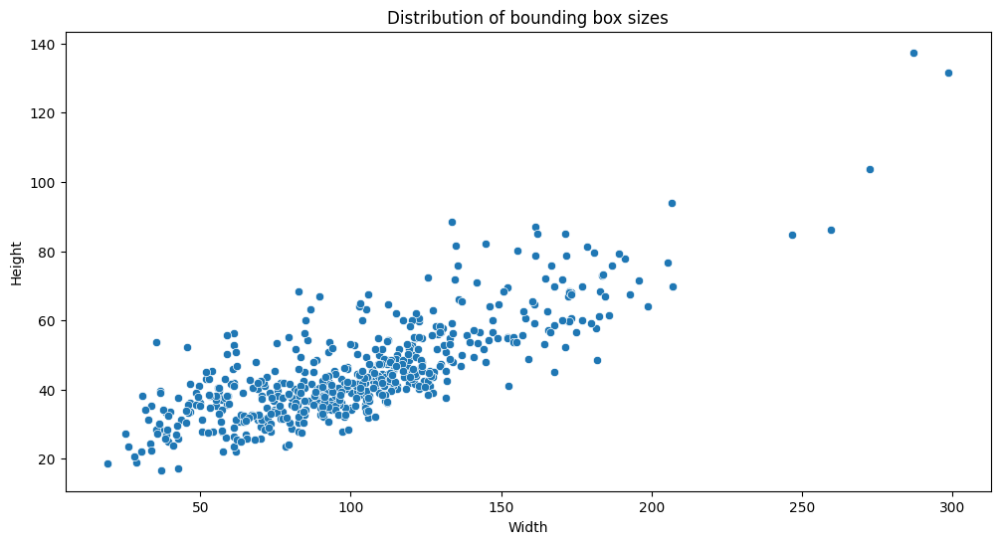

In [8]:
plt.figure(figsize=(12, 6))
df['width'] = df['xmax'] - df['xmin']
df['height'] = df['ymax'] - df['ymin']
sns.scatterplot(x='width', y='height', data=df)
plt.title('Distribution of bounding box sizes')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


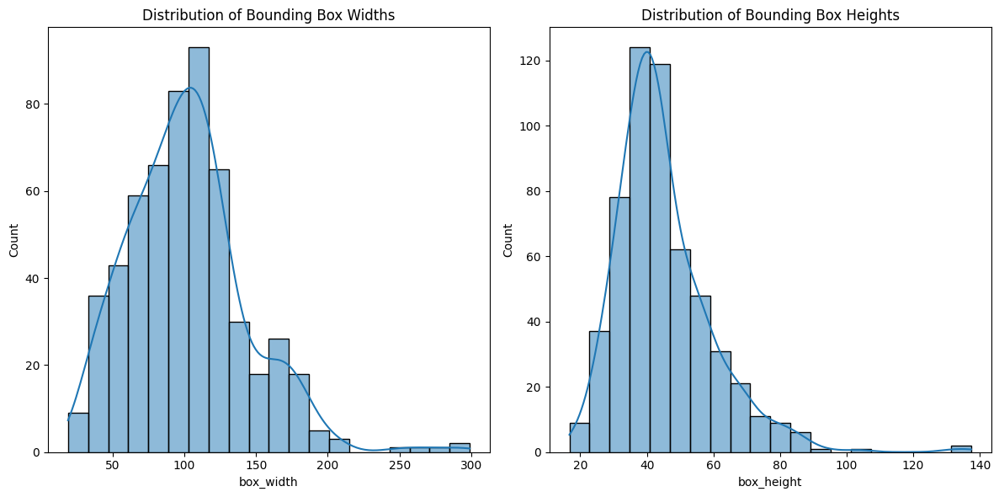

In [9]:
df['box_width'] = df['xmax'] - df['xmin']
df['box_height'] = df['ymax'] - df['ymin']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df['box_width'], bins=20, kde=True)
plt.title('Distribution of Bounding Box Widths')

plt.subplot(1, 2, 2)
sns.histplot(df['box_height'], bins=20, kde=True)
plt.title('Distribution of Bounding Box Heights')

plt.tight_layout();
plt.show();

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


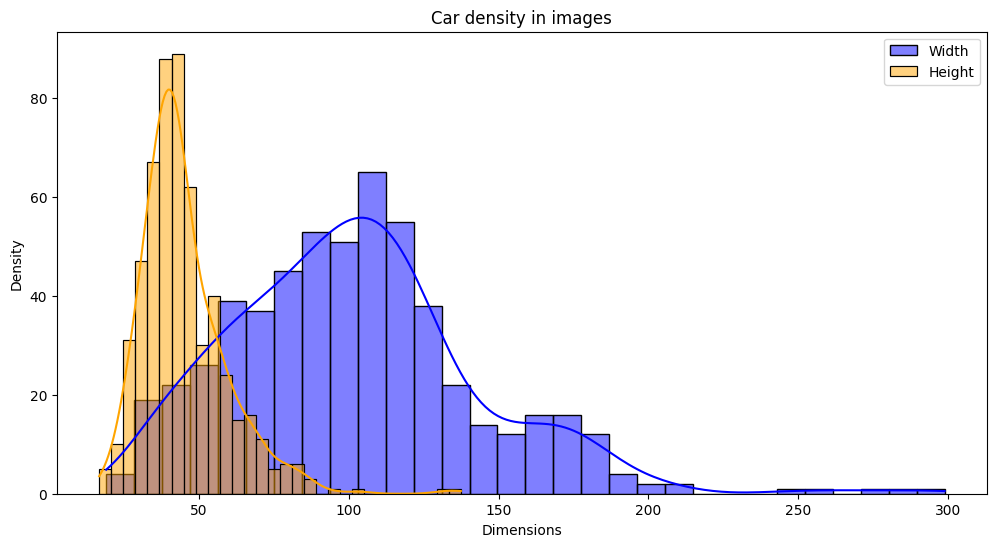

In [10]:
plt.figure(figsize=(12, 6))
sns.histplot(df['width'], bins=30, kde=True, color='blue', label='Width')
sns.histplot(df['height'], bins=30, kde=True, color='orange', label='Height')
plt.title('Car density in images')
plt.xlabel('Dimensions')
plt.ylabel('Density')
plt.legend()
plt.show()

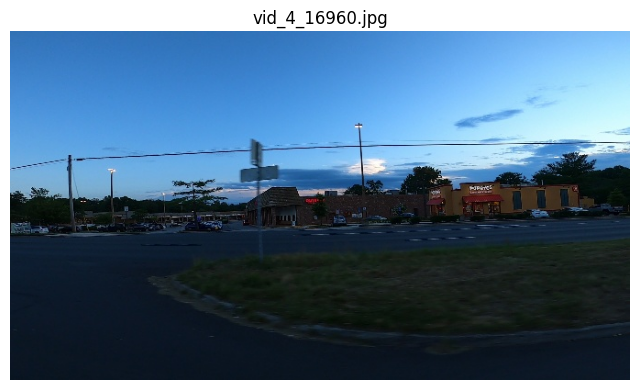

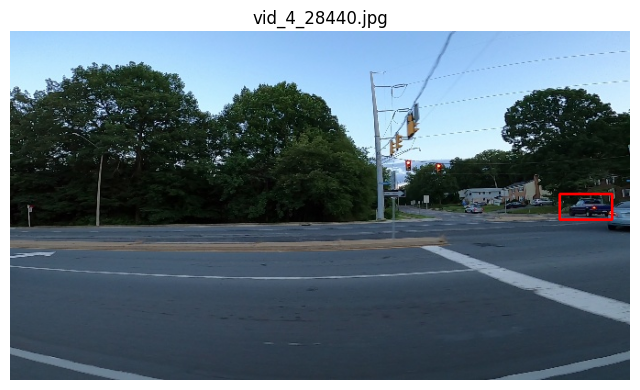

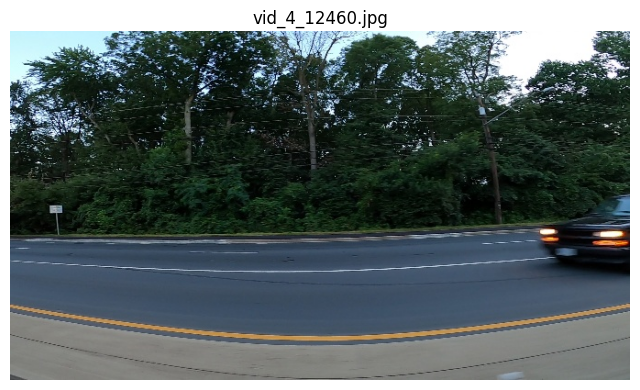

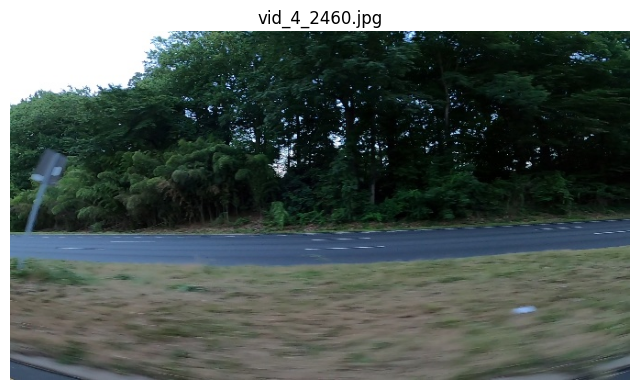

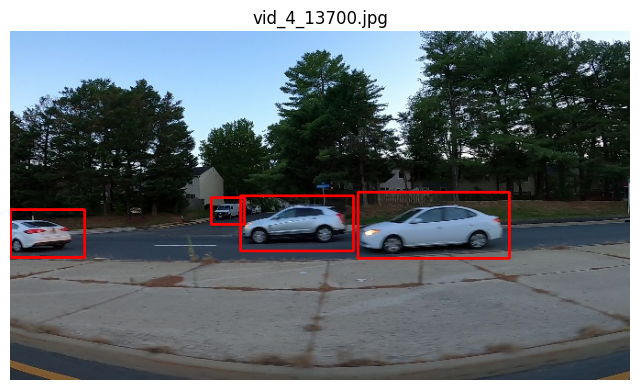

...

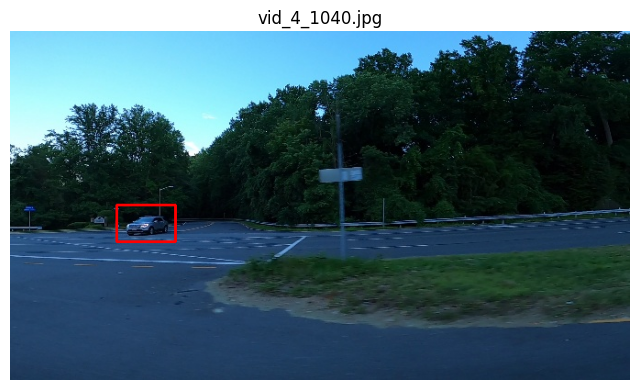

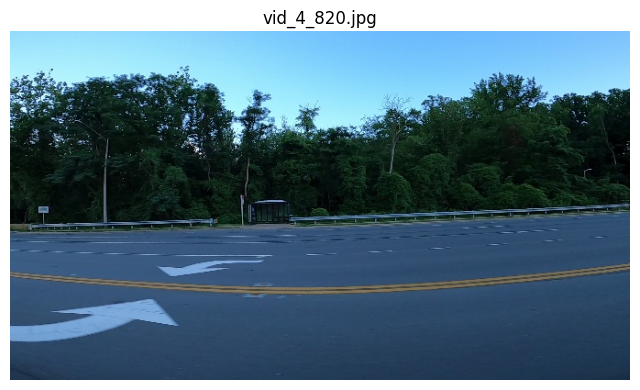

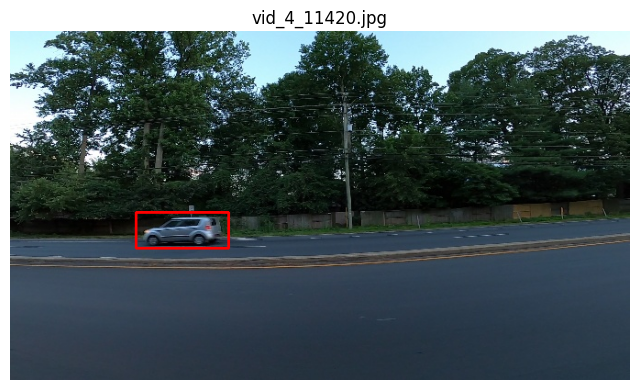

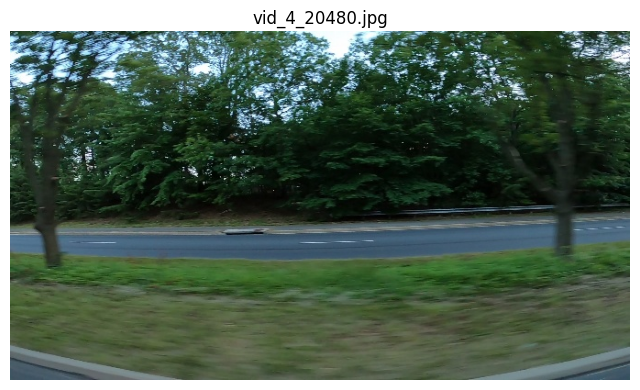

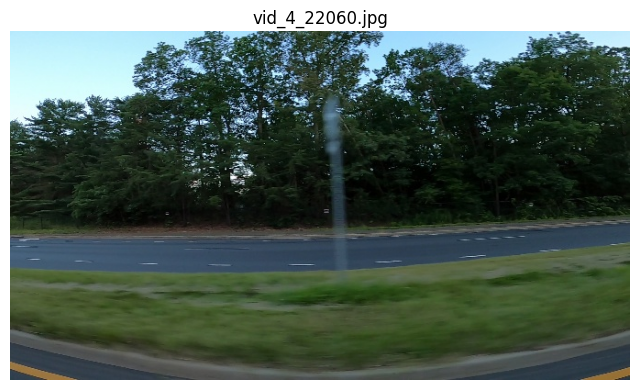

In [11]:
def plot_images_with_boxes(image_path, df, n=12):
    images = glob(f'{image_path}/*.jpg')[:n]
    for img_path in images:
        img = cv2.imread(img_path)
        img_name = os.path.basename(img_path)
        boxes = df[df['image'] == img_name]

        for _, box in boxes.iterrows():
            cv2.rectangle(img,
                          (int(box['xmin']), int(box['ymin'])),
                          (int(box['xmax']), int(box['ymax'])),
                          (0,0,255),2)

        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(img_name)
        plt.axis('off')
        plt.show()
plot_images_with_boxes(train_data, df)

* # **3- Preparing the Dataset for YOLO¶**

In [12]:
def create_yolo_annotation(row, img_width, img_height):
    x_center = ((row['xmin'] + row['xmax']) / 2) / img_width
    y_center = ((row['ymin'] + row['ymax']) / 2) / img_height
    width = (row['xmax'] - row['xmin']) / img_width
    height = (row['ymax'] - row['ymin']) / img_height
    return f"0 {x_center} {y_center} {width} {height}"

In [13]:
for img_name in df['image'].unique():
    img_df = df[df['image'] == img_name]
    img_path = os.path.join(train_data,img_name)
    img = cv2.imread(img_path)
    if img is not None:
        img_height, img_width = img.shape[:2]

        if np.random.rand() < 0.8:
            subset = "train"
        else:
            subset = "val"

        dst_img_path = os.path.join(images_dir, subset, img_name)
        cv2.imwrite(dst_img_path, img)

        annotation_path = os.path.join(labels_dir, subset, f"{img_name.split('.')[0]}.txt")
        with open(annotation_path, 'w') as f:
            for _, row in img_df.iterrows():
                yolo_annotation = create_yolo_annotation(row, img_width, img_height)
                f.write(yolo_annotation + '\n')

In [14]:
yaml_content = f"""
path: {root_dir}
train: images/train
val: images/val

nc: 1
names: ['car']
"""
with open('car_detection.yaml', 'w') as f:
    f.write(yaml_content)
print("YAML configuration file created.")

YAML configuration file created.


In [15]:
model = YOLO('yolov8s.pt')

100%|██████████| 21.5M/21.5M [00:00<00:00, 96.9MB/s]


In [16]:
results = model.train(
    data='car_detection.yaml',
    epochs=33,
    imgsz=640,
    batch=16,
    name='car_detection_model'
)

Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=car_detection.yaml, epochs=33, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=car_detection_model, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

100%|██████████| 755k/755k [00:00<00:00, 48.1MB/s]
2024-12-11 06:11:31,295	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-12-11 06:11:31,816	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 189MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/data/labels/train... 288 images, 0 backgrounds, 0 corrupt: 100%|██████████| 288/288 [00:00<00:00, 1096.45it/s]

train: New cache created: /kaggle/working/data/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/data/labels/val... 67 images, 0 backgrounds, 0 corrupt: 100%|██████████| 67/67 [00:00<00:00, 1156.20it/s]

val: New cache created: /kaggle/working/data/labels/val.cache


Plotting labels to runs/detect/car_detection_model/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/car_detection_model
Starting training for 33 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/33      4.07G      1.629      2.563      1.245         51        640: 100%|██████████| 18/18 [00:05<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]

                   all         67        111      0.946       0.95      0.965      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/33      4.05G        1.3      1.054      1.096         46        640: 100%|██████████| 18/18 [00:04<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.56it/s]

                   all         67        111      0.924      0.882      0.949      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/33      4.04G      1.308      0.852      1.117         50        640: 100%|██████████| 18/18 [00:04<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.81it/s]

                   all         67        111      0.713       0.85      0.704      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/33         4G      1.273     0.7977      1.109         40        640: 100%|██████████| 18/18 [00:04<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.16it/s]

                   all         67        111      0.854      0.792      0.846      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/33      3.84G      1.314     0.7852      1.107         32        640: 100%|██████████| 18/18 [00:04<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.78it/s]


                   all         67        111      0.971      0.911      0.977       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/33      4.04G      1.265     0.7161      1.112         46        640: 100%|██████████| 18/18 [00:04<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.94it/s]


                   all         67        111      0.809      0.878      0.893      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/33      3.86G      1.372     0.7953      1.132         44        640: 100%|██████████| 18/18 [00:04<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.77it/s]

                   all         67        111      0.843      0.725      0.834      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/33      3.88G      1.294     0.7352      1.099         41        640: 100%|██████████| 18/18 [00:04<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.50it/s]

                   all         67        111      0.947      0.802      0.918      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/33      3.86G      1.245     0.6861      1.104         46        640: 100%|██████████| 18/18 [00:04<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.72it/s]


                   all         67        111      0.911      0.955      0.982      0.625

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/33      3.87G      1.195     0.6341      1.069         50        640: 100%|██████████| 18/18 [00:04<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.81it/s]


                   all         67        111      0.963      0.943      0.982      0.643

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/33         4G      1.168     0.6402      1.085         37        640: 100%|██████████| 18/18 [00:04<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.77it/s]

                   all         67        111      0.962      0.924      0.965      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/33      3.89G      1.151     0.6076       1.07         44        640: 100%|██████████| 18/18 [00:04<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.63it/s]

                   all         67        111      0.929      0.947       0.97       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/33      3.84G      1.149      0.607      1.077         59        640: 100%|██████████| 18/18 [00:04<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.86it/s]

                   all         67        111      0.972      0.942      0.977      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/33      4.05G      1.159      0.586      1.082         44        640: 100%|██████████| 18/18 [00:04<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.99it/s]

                   all         67        111      0.973      0.973      0.986      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/33      3.86G      1.135     0.5817      1.068         43        640: 100%|██████████| 18/18 [00:04<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.88it/s]


                   all         67        111      0.991       0.97      0.993       0.62

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/33      3.88G      1.174     0.5752      1.076         52        640: 100%|██████████| 18/18 [00:04<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.61it/s]

                   all         67        111      0.981       0.94      0.986      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/33      3.84G      1.084     0.5545      1.046         53        640: 100%|██████████| 18/18 [00:04<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.92it/s]

                   all         67        111      0.963      0.939      0.969      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/33      4.04G      1.112     0.5424      1.057         43        640: 100%|██████████| 18/18 [00:04<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.96it/s]

                   all         67        111          1      0.926      0.979      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/33      3.86G       1.13     0.5639      1.052         42        640: 100%|██████████| 18/18 [00:04<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.58it/s]

                   all         67        111      0.988      0.964      0.988      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/33      3.88G      1.125     0.5449      1.053         39        640: 100%|██████████| 18/18 [00:04<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.54it/s]

                   all         67        111      0.991      0.973      0.994      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/33         4G      1.069     0.5309       1.03         51        640: 100%|██████████| 18/18 [00:04<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.96it/s]

                   all         67        111      0.988      0.973      0.993      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/33      3.88G      1.096     0.5273      1.032         32        640: 100%|██████████| 18/18 [00:04<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.88it/s]

                   all         67        111      0.991      0.971      0.991      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/33      3.86G      1.069     0.5026      1.036         38        640: 100%|██████████| 18/18 [00:04<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.66it/s]

                   all         67        111      0.991      0.958      0.993      0.657


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/33      3.87G      1.053     0.4966      1.045         16        640: 100%|██████████| 18/18 [00:04<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.42it/s]

                   all         67        111      0.991       0.98      0.994      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/33      3.84G      1.037      0.489      1.031         27        640: 100%|██████████| 18/18 [00:04<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.82it/s]

                   all         67        111       0.99      0.982      0.994      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/33      4.02G      1.041     0.4879      1.032         21        640: 100%|██████████| 18/18 [00:04<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.75it/s]

                   all         67        111      0.991      0.982      0.993      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/33      3.84G      1.021     0.4704      1.014         27        640: 100%|██████████| 18/18 [00:04<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.57it/s]


                   all         67        111      0.989      0.982      0.994       0.67

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/33      4.03G     0.9723     0.4539     0.9902         19        640: 100%|██████████| 18/18 [00:04<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.58it/s]

                   all         67        111      0.973      0.982      0.994      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/33      3.99G     0.9973     0.4556      1.002         24        640: 100%|██████████| 18/18 [00:04<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.59it/s]

                   all         67        111      0.986      0.982      0.994      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/33      3.86G     0.9869     0.4636      1.021         25        640: 100%|██████████| 18/18 [00:04<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.88it/s]

                   all         67        111      0.982      0.982      0.994      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/33         4G       0.97     0.4469      1.012         26        640: 100%|██████████| 18/18 [00:04<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.70it/s]

                   all         67        111      0.977      0.982      0.993       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/33      4.02G     0.9541     0.4344      1.004         23        640: 100%|██████████| 18/18 [00:04<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.33it/s]

                   all         67        111       0.99      0.982      0.994      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/33      3.84G     0.9517     0.4372      1.001         29        640: 100%|██████████| 18/18 [00:04<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.79it/s]

                   all         67        111      0.991       0.98      0.994      0.678



33 epochs completed in 0.054 hours.
Optimizer stripped from runs/detect/car_detection_model/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/car_detection_model/weights/best.pt, 22.5MB

Validating runs/detect/car_detection_model/weights/best.pt...
Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.98it/s]


                   all         67        111      0.982      0.982      0.994       0.69
Speed: 0.1ms preprocess, 2.7ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/car_detection_model


In [17]:
results = model.val()
print(results)

Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /kaggle/working/data/labels/val.cache... 67 images, 0 backgrounds, 0 corrupt: 100%|██████████| 67/67 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.65it/s]


                   all         67        111      0.982      0.982      0.994       0.69
Speed: 0.2ms preprocess, 6.1ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/car_detection_model2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x782a55b3f670>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.03

In [18]:
print(f"Mean Average Precision @.5:.95 : {results.box.map}")
print(f"Mean Average Precision @ .50   : {results.box.map50}")
print(f"Mean Average Precision @ .70   : {results.box.map75}")

Mean Average Precision @.5:.95 : 0.6900003342789633
Mean Average Precision @ .50   : 0.9940273490827112
Mean Average Precision @ .70   : 0.8944924110134695



image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26420.jpg: 384x640 (no detections), 41.7ms
Speed: 1.8ms preprocess, 41.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


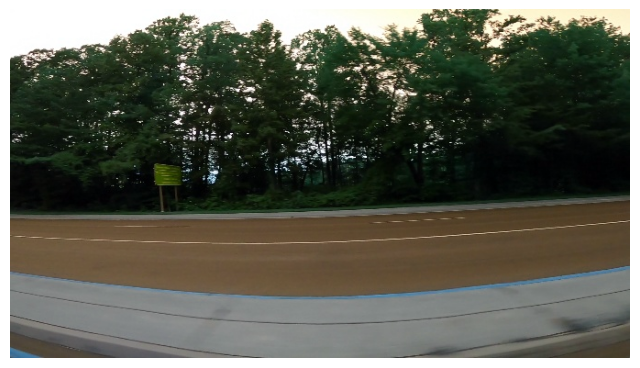


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31520.jpg: 384x640 (no detections), 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


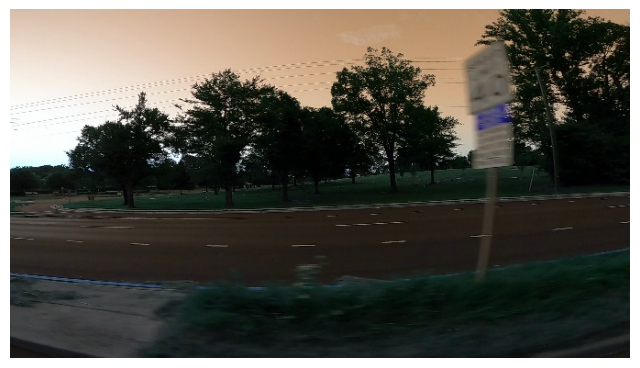


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29420.jpg: 384x640 2 cars, 10.7ms
Speed: 1.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


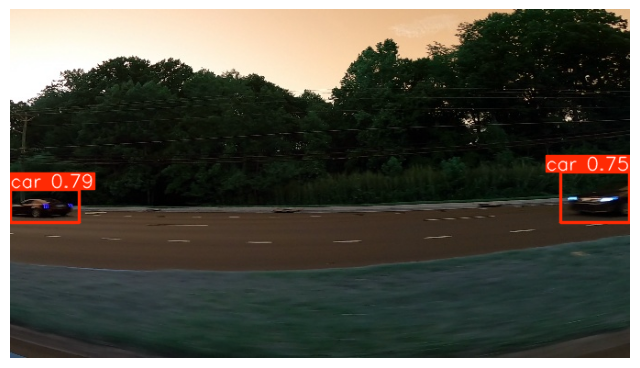


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31720.jpg: 384x640 1 car, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


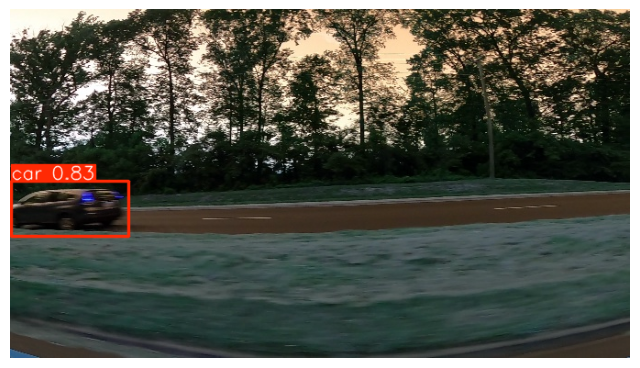


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26560.jpg: 384x640 1 car, 10.7ms
Speed: 1.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


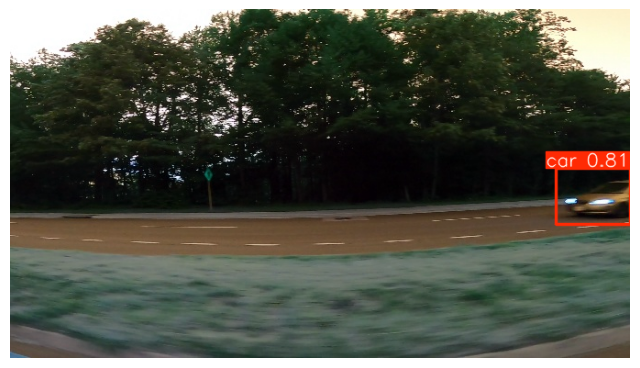


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_27840.jpg: 384x640 1 car, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


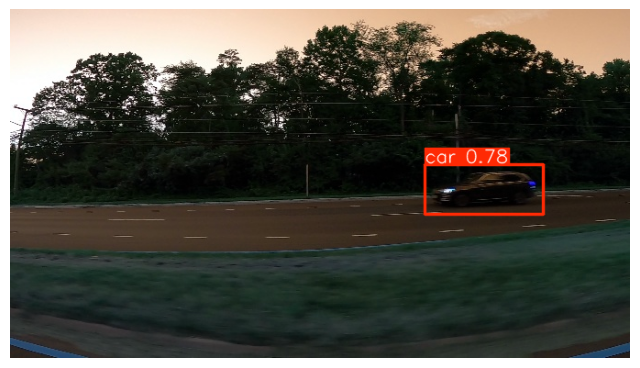


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_28560.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


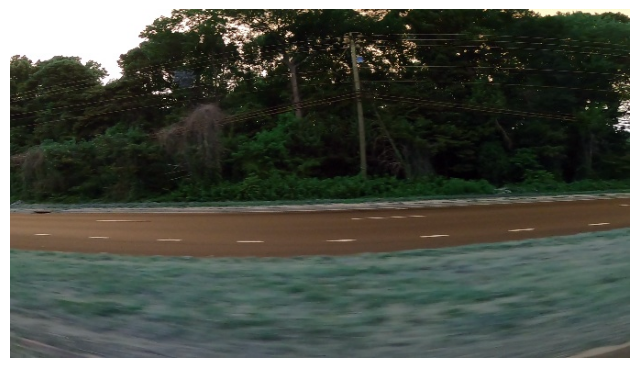


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_28360.jpg: 384x640 (no detections), 10.8ms
Speed: 1.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


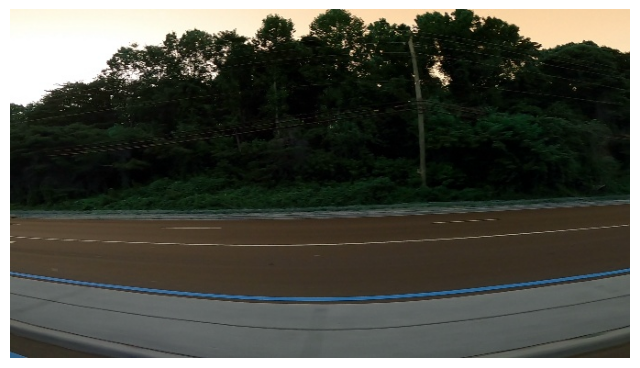


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


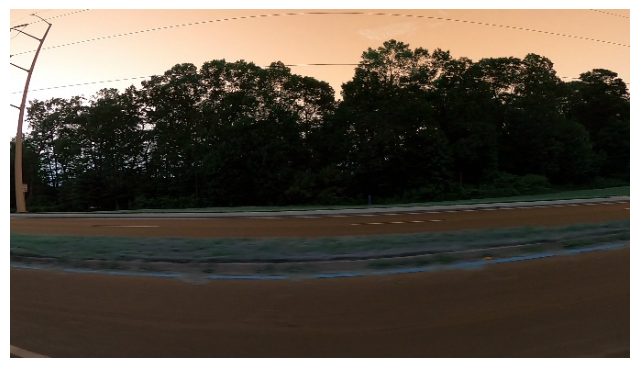


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29560.jpg: 384x640 1 car, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


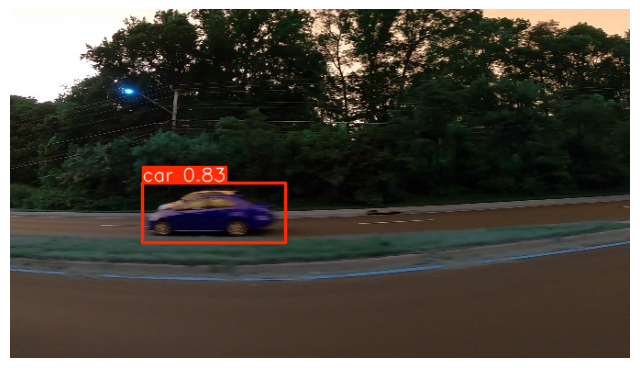


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29020.jpg: 384x640 1 car, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


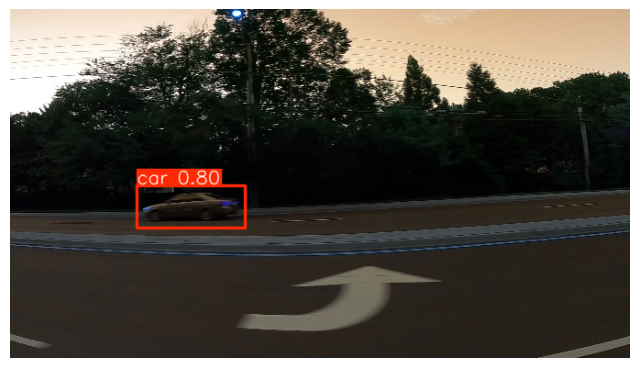


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30720.jpg: 384x640 (no detections), 10.8ms
Speed: 1.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


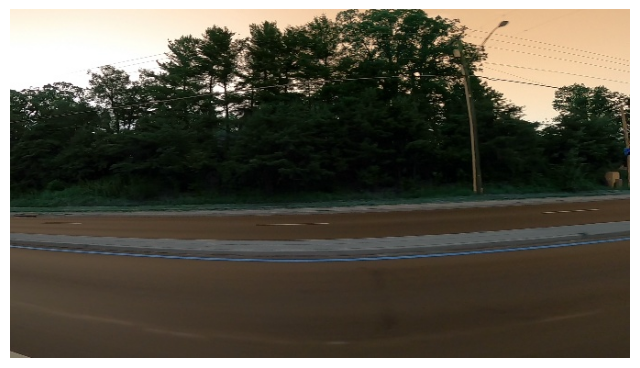


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26940.jpg: 384x640 3 cars, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


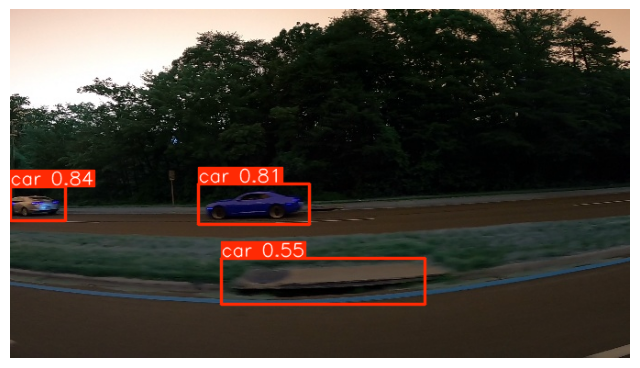


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31620.jpg: 384x640 1 car, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


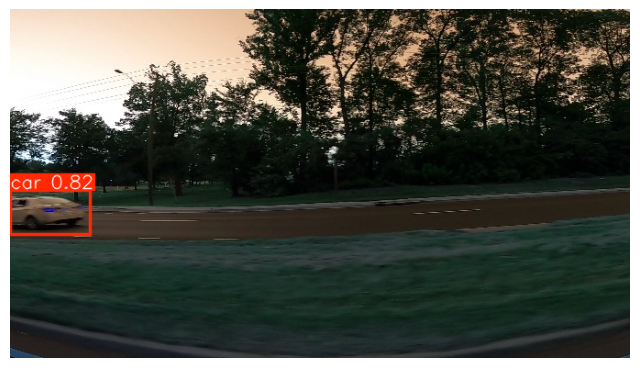


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31100.jpg: 384x640 1 car, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


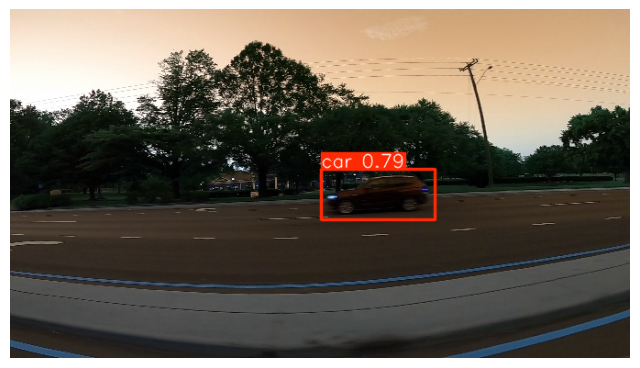


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31040.jpg: 384x640 3 cars, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


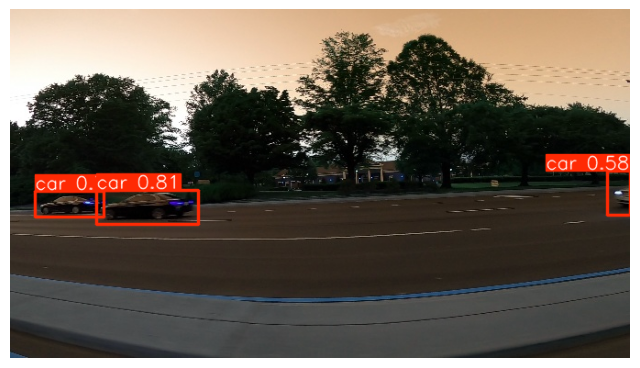


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31260.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


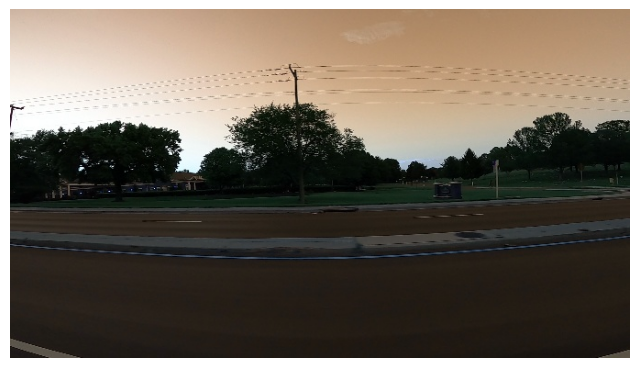


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29980.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


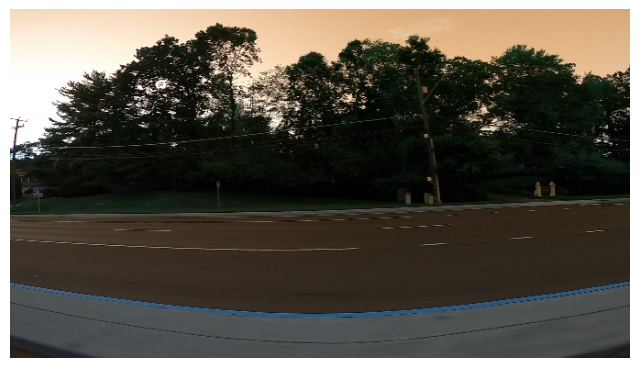


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26900.jpg: 384x640 3 cars, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


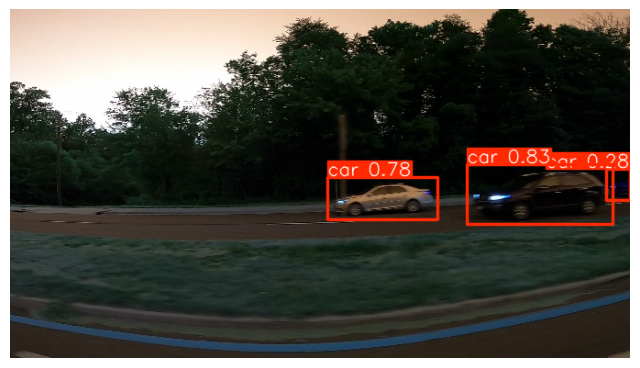


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29900.jpg: 384x640 (no detections), 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


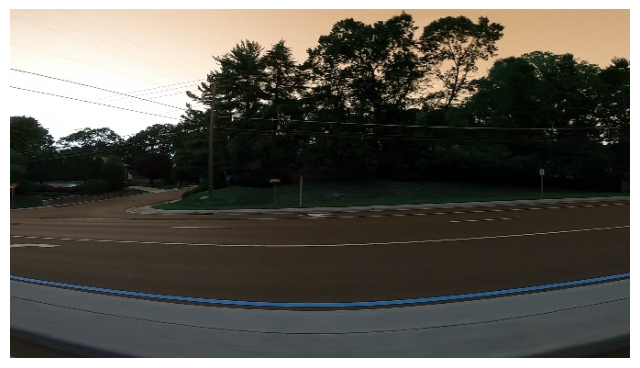


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30680.jpg: 384x640 (no detections), 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


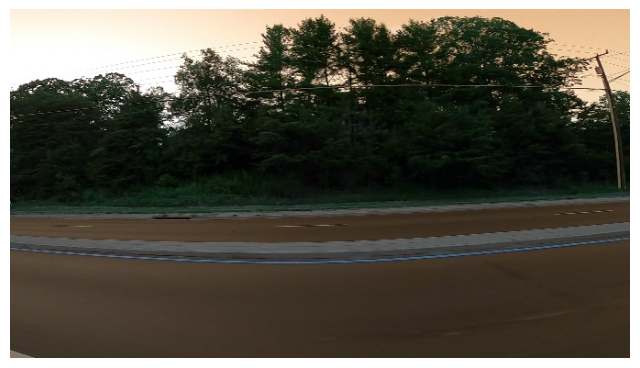


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26800.jpg: 384x640 3 cars, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


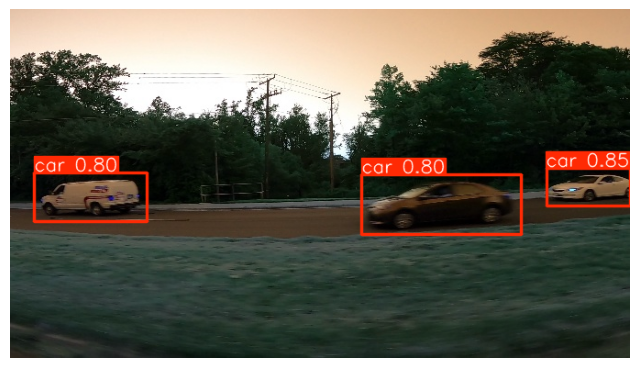


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30700.jpg: 384x640 (no detections), 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


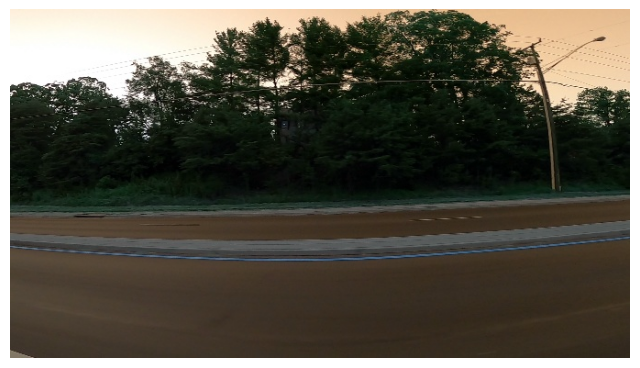


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26780.jpg: 384x640 2 cars, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


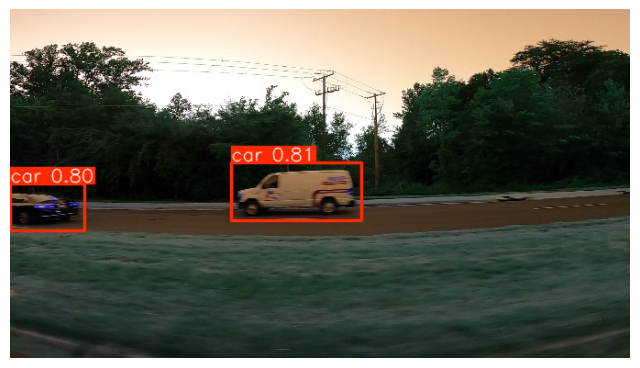


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_28500.jpg: 384x640 1 car, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


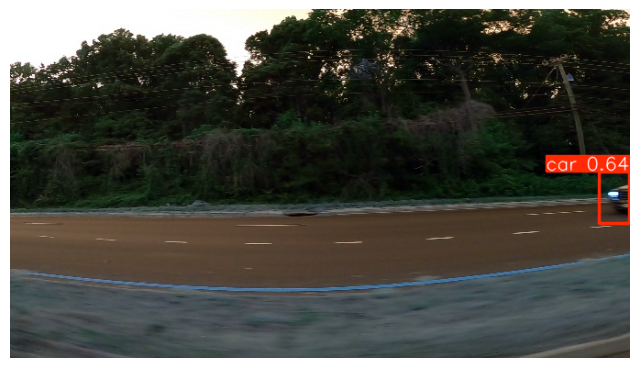


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_27760.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


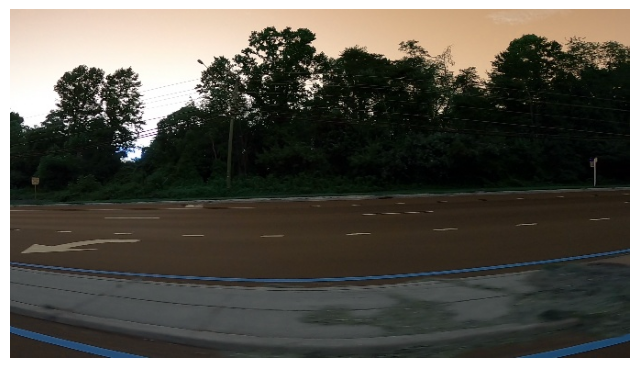


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_27680.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


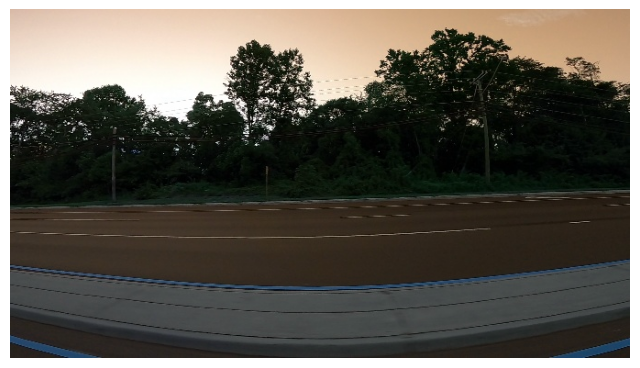


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26980.jpg: 384x640 (no detections), 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


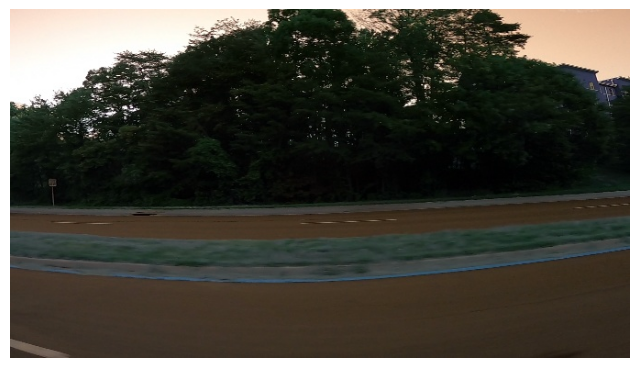


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_27360.jpg: 384x640 1 car, 10.7ms
Speed: 1.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


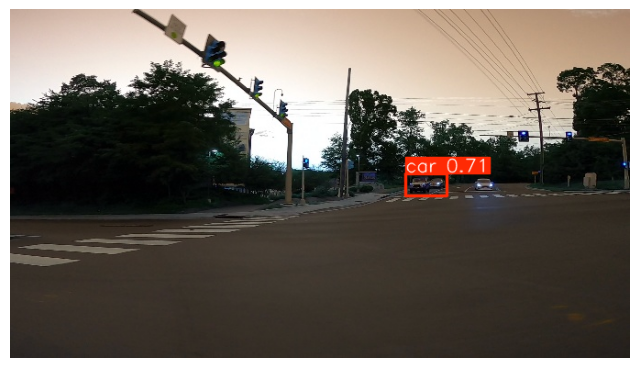


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31080.jpg: 384x640 2 cars, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


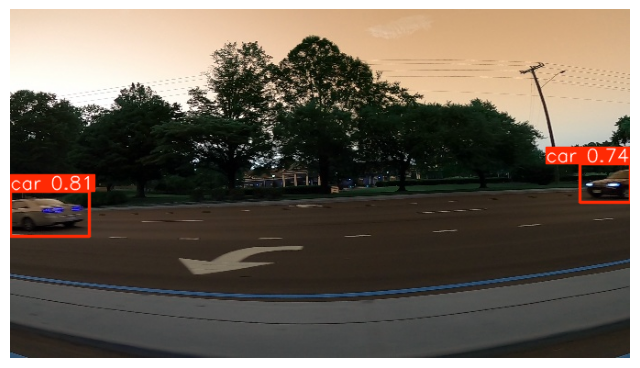


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30860.jpg: 384x640 1 car, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


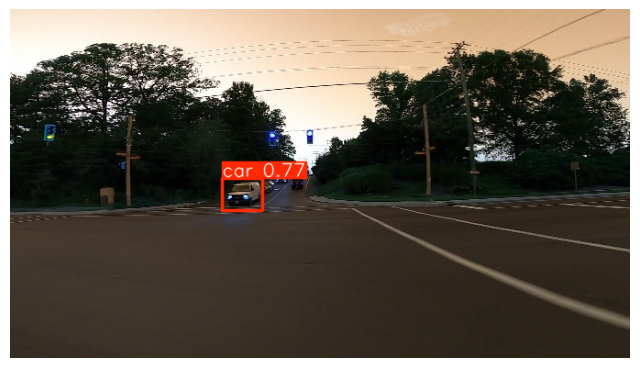


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26920.jpg: 384x640 2 cars, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


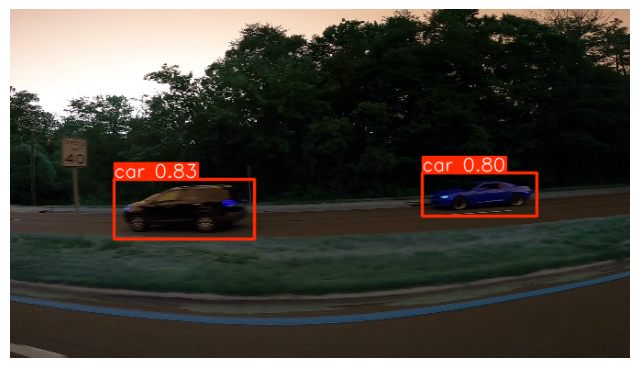


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30740.jpg: 384x640 1 car, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


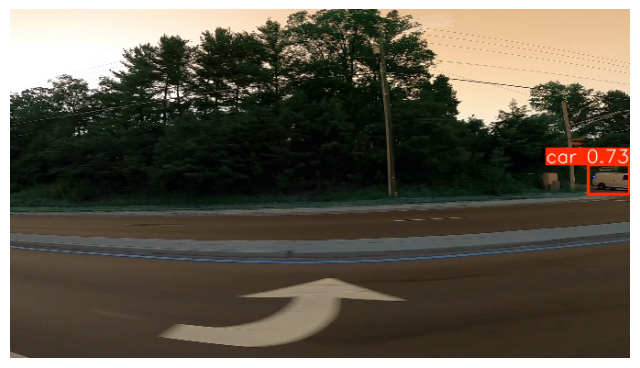


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26700.jpg: 384x640 2 cars, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


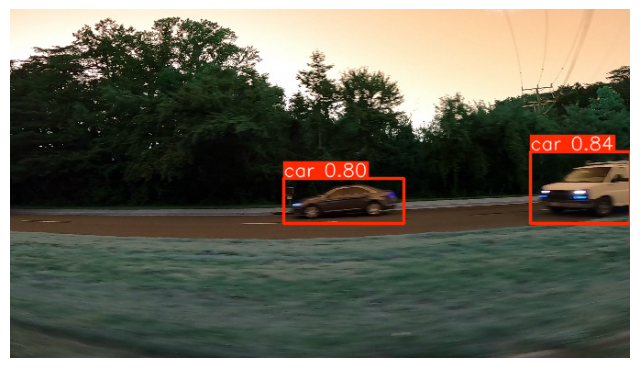


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26840.jpg: 384x640 1 car, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


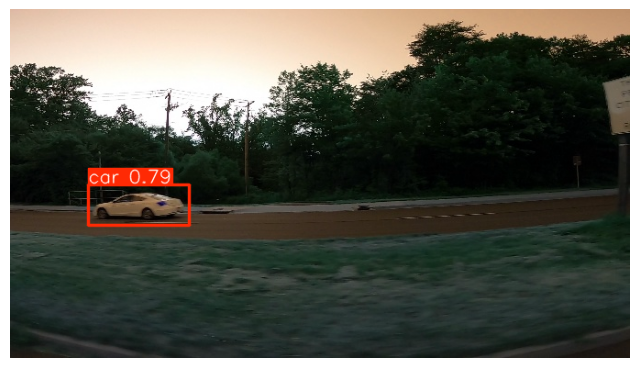

In [19]:
image_dir = "/kaggle/input/car-object-detection/data/testing_images"

all_images = os.listdir(image_dir)
selected_images = all_images[:35]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)

        plt.axis('off')
        plt.show()
